In [2]:
!pip install datasets pandas scikit-learn
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from datasets import load_dataset
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import metrics


df = pd.read_csv("hf://datasets/maharshipandya/spotify-tracks-dataset/dataset.csv")
df = df.drop(columns=["Unnamed: 0"])

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 42.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.1/40.1 MB 54.2 MB/s eta 0:00:00:00:01

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


/usr/local/python/3.12.1/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
df.head(10)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic
7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic
8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic
9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,1,-6.770,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic


In [4]:
df.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [5]:
pd.set_option('display.max_rows', None)
print(df['track_genre'].value_counts())

track_genre
acoustic             1000
afrobeat             1000
alt-rock             1000
alternative          1000
ambient              1000
anime                1000
black-metal          1000
bluegrass            1000
blues                1000
brazil               1000
breakbeat            1000
british              1000
cantopop             1000
chicago-house        1000
children             1000
chill                1000
classical            1000
club                 1000
comedy               1000
country              1000
dance                1000
dancehall            1000
death-metal          1000
deep-house           1000
detroit-techno       1000
disco                1000
disney               1000
drum-and-bass        1000
dub                  1000
dubstep              1000
edm                  1000
electro              1000
electronic           1000
emo                  1000
folk                 1000
forro                1000
french               1000
funk                 1000


In [6]:
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64


In [7]:
#print the row that has missing album name
df[df['album_name'].isnull()]

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,7,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


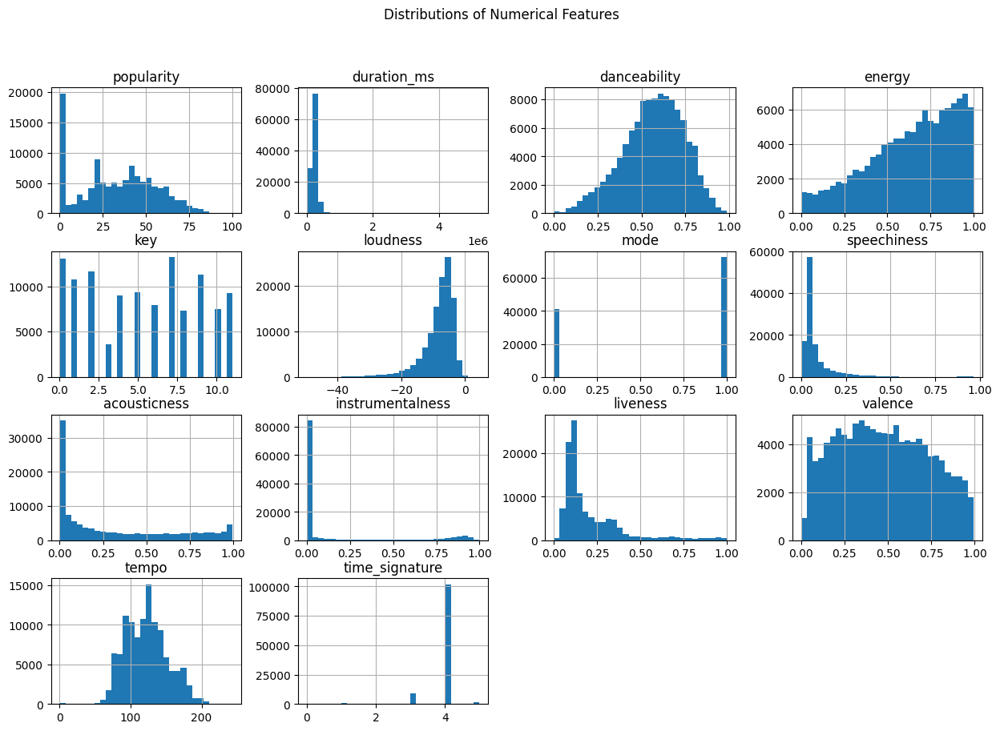

In [8]:
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns
df[numerical_features].hist(figsize=(15, 10), bins=30)
plt.suptitle('Distributions of Numerical Features')
plt.show()


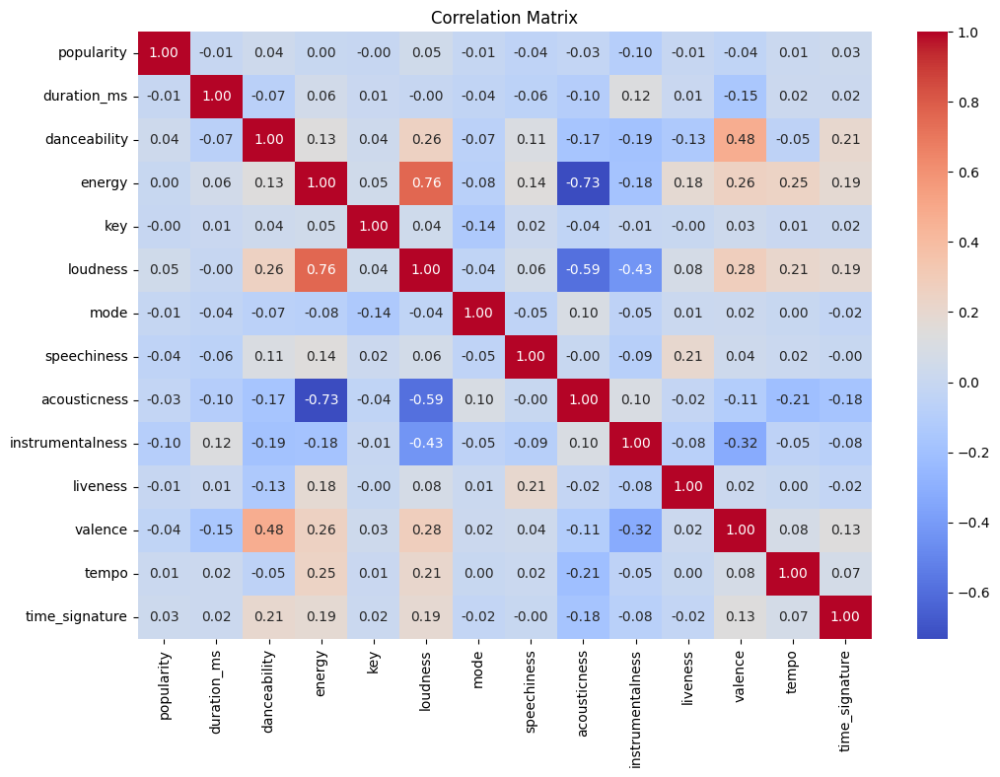

In [9]:
plt.figure(figsize=(12, 8))
correlation_matrix = df[numerical_features].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


# Project Check-in 2

In [10]:
response_variable = 'energy'
predictors = ['valence', 'tempo', 'liveness', 'loudness']

# drop rows with missing vals
df = df.dropna(subset=[response_variable] + predictors)

X = df[predictors]
y = df[response_variable]

# split data into test & training sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [11]:
# initialize linear regression model
model = LinearRegression()

# train model
model.fit(X_train, y_train)

# predict on training and validation sets
y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)

# calculate evaluation metrics
train_r2 = r2_score(y_train, y_train_pred)
val_r2 = r2_score(y_val, y_val_pred)
train_mse = mean_squared_error(y_train, y_train_pred)
val_mse = mean_squared_error(y_val, y_val_pred)

print(f"training R2 score: {train_r2}")
print(f"validation R2 score: {val_r2}")
print(f"training MSE: {train_mse}")
print(f"validation MSE: {val_mse}")

training R2 score: 0.6073480432972269
validation R2 score: 0.6027962948212895
training MSE: 0.024873568696761255
validation MSE: 0.02499865023148087


In [12]:
# check if the model is overfitting / underfitting
if train_mse < val_mse:
    print("potential overfitting")
elif train_mse > val_mse:
    print("potential underfitting")
else:
    print("no significant over or underfitting")

potential overfitting


In [13]:
# ridge regression (L2 regularization)
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
y_val_ridge_pred = ridge.predict(X_val)

# lasso regression (L1 regularization)
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
y_val_lasso_pred = lasso.predict(X_val)

# calculate evaluation metrics for ridge and lasso
ridge_r2 = r2_score(y_val, y_val_ridge_pred)
lasso_r2 = r2_score(y_val, y_val_lasso_pred)
ridge_mse = mean_squared_error(y_val, y_val_ridge_pred)
lasso_mse = mean_squared_error(y_val, y_val_lasso_pred)

print(f"ridge validation R2: {ridge_r2}")
print(f"lasso validation R2: {lasso_r2}")
print(f"ridge validation MSE: {ridge_mse}")
print(f"lasso validation MSE: {lasso_mse}")

ridge validation R2: 0.6027967112815098
lasso validation R2: 0.5782999648636854
ridge validation MSE: 0.02499862402089107
lasso validation MSE: 0.02654036592189612


Since the unregularized model (Linear Regression) didn’t show significant overfitting, regularization (Ridge and Lasso) doesn’t seem to improve the performance much in this case. The regularization didn't help because the model wasn't overfitting significantly to begin with (training mse is almost equal to validation mse).

Regularization would be more helpful if: training performance is significantly better than validation performance, showing overfitting. If there was significant overfitting on the original model, after applying regularization, the validation performance should improve (lower MSE, higher R²), and the gap between training and validation performance should narrow.

# Project Check-in 3

In [14]:
lr_all = LogisticRegression(class_weight='balanced', solver='liblinear')
X_train, X_test, y_train, y_test = train_test_split(df[numerical_features], df['explicit'], test_size=0.2, random_state=12345)
y_test = y_test.to_frame()
lr_all.fit(X=X_train, y=y_train)
lr_all.intercept_, lr_all.coef_

(array([0.11348855]),
 array([[ 6.48777850e-03, -4.52530365e-06,  2.43921902e+00,
          4.36255301e-01, -3.03851273e-03,  5.89381580e-02,
         -1.62905989e-01,  5.13782760e+00, -1.60078659e+00,
         -1.52460802e+00, -6.94706141e-02, -1.79758338e+00,
         -1.37381612e-03,  8.92134214e-02]]))

In [15]:
print(type(y_test))
pred_val_sample = pd.DataFrame(dict(
    explicit = y_test['explicit'],
    lr_predict = lr_all.predict_proba(X_test)[:,1],
    lr_predict_binary = lr_all.predict(X_test)))
pred_val_sample

<class 'pandas.core.frame.DataFrame'>


,explicit,lr_predict,lr_predict_binary
102399,False,2.469930e-01,False
96198,False,1.487952e-01,False
59541,False,1.322950e-02,False
20787,True,6.762790e-01,True
36287,False,3.096272e-01,False
88675,False,5.063301e-01,True
105911,False,5.941828e-01,True
105758,False,3.722519e-01,False
66407,False,9.090489e-01,True
70506,False,6.376956e-01,True


In [16]:
conf_lr = metrics.confusion_matrix(y_true=pred_val_sample['explicit'],
                                   y_pred=pred_val_sample['lr_predict_binary'])
conf_lr

array([[14688,  6127],
       [  489,  1496]])

In [17]:
# Logistic regression Accuracy
(conf_lr[0, 0] + conf_lr[1, 1]) / conf_lr.sum()

np.float64(0.7098245614035088)

In [18]:
# Logistic regression Accuracy alternative
metrics.accuracy_score(y_true=pred_val_sample['explicit'],
                       y_pred=pred_val_sample['lr_predict_binary'])

0.7098245614035088

In [19]:
# precision
conf_lr[1, 1] / (conf_lr[1, 1] + conf_lr[0, 1])

np.float64(0.19624819624819625)

In [20]:
# recall score for positive classs
(conf_lr[1, 1]) / conf_lr[1,:].sum()

np.float64(0.7536523929471033)

In [21]:
# recall score for positive class alternative
metrics.recall_score(y_true=pred_val_sample['explicit'],
                     y_pred=pred_val_sample['lr_predict_binary'])

np.float64(0.7536523929471033)

In [22]:
# recall score for negative class alternative
(conf_lr[0, 0]) / conf_lr[0,:].sum()

np.float64(0.7056449675714629)

In [23]:
# recall score for negative class
metrics.recall_score(y_true=pred_val_sample['explicit'],
                     y_pred=pred_val_sample['lr_predict_binary'],
                     pos_label=0)

np.float64(0.7056449675714629)

In [24]:
px.histogram(pred_val_sample, x='lr_predict', color='explicit',
             nbins=20, opacity=0.5,
             barmode='overlay')

Poor results without utilizing feature selection.

# Project Check In 4:

In [25]:
# prepare knn
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, f1_score
X = df[numerical_features]
y = df['explicit']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

In [26]:
# standardize features
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [27]:
# tuned k previously by iterating through multiple possible k values
k = 5
knn_model = KNeighborsClassifier(n_neighbors=k)
knn_model.fit(X_train, y_train)
y_pred = knn_model.predict(X_test)
print(f"k={k}, Accuracy: {accuracy_score(y_test, y_pred)}")

k=5, Accuracy: 0.925


In [28]:
# predict on the training data
y_train_pred = knn_model.predict(X_train)

# confusion matrix
conf_matrix_train = confusion_matrix(y_train, y_train_pred)
print("Confusion Matrix (Training):\n", conf_matrix_train)

# prediction accuracy
accuracy_train = accuracy_score(y_train, y_train_pred)
print("Accuracy (Training):", accuracy_train)

# prediction error
prediction_error_train = 1 - accuracy_train
print("Prediction Error (Training):", prediction_error_train)

# true positive rate (recall for the positive class)
true_positive_rate_train = conf_matrix_train[1, 1] / (conf_matrix_train[1, 1] + conf_matrix_train[1, 0])
print("True Positive Rate (Training):", true_positive_rate_train)

# true negative rate (recall for the negative class)
true_negative_rate_train = conf_matrix_train[0, 0] / (conf_matrix_train[0, 0] + conf_matrix_train[0, 1])
print("True Negative Rate (Training):", true_negative_rate_train)

# F1 score
f1_score_train = f1_score(y_train, y_train_pred)
print("F1 Score (Training):", f1_score_train)

Confusion Matrix (Training):
 [[82231  1108]
 [ 4203  3658]]
Accuracy (Training): 0.9417653508771929
Prediction Error (Training): 0.05823464912280707
True Positive Rate (Training): 0.465335199084086
True Negative Rate (Training): 0.9867049040665234
F1 Score (Training): 0.5793933634275759


The model is biased towards a "false" classification, making KNN not very effective. Future usage of classifiers such as random forests with class weights may find an improved accuracy model.

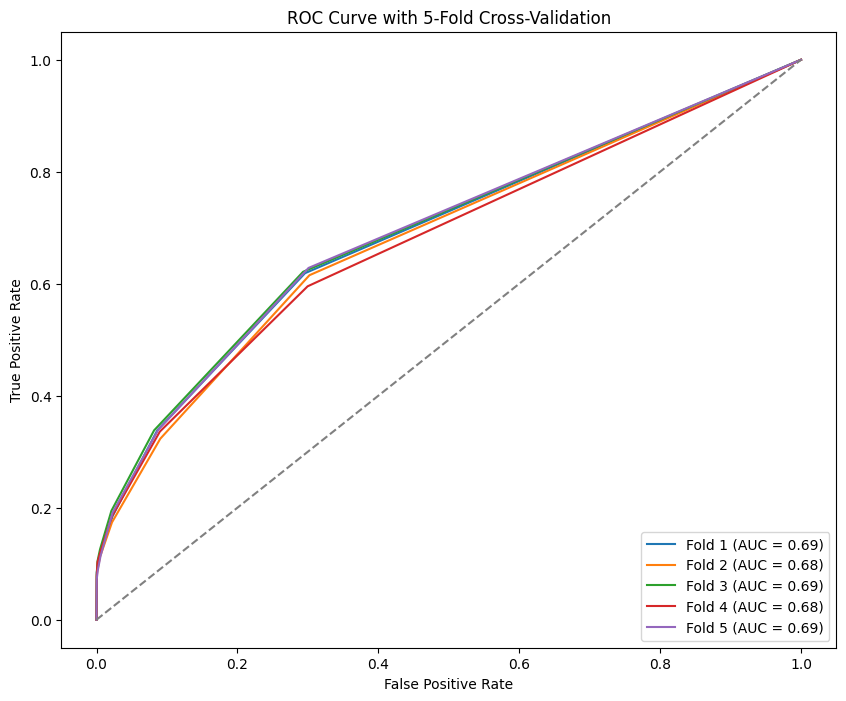

Average AUC across folds: 0.69
Average accuracy across folds: 0.92


In [29]:
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
from sklearn.model_selection import cross_val_score, StratifiedKFold
import matplotlib.pyplot as plt
import numpy as np
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_auc_score, roc_curve, auc

# initialize the KNN model with k = 6
knn_model = KNeighborsClassifier(n_neighbors=6)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
auc_scores = []
accuracy_scores = []
plt.figure(figsize=(10, 8))


for i, (train_index, test_index) in enumerate(skf.split(X, y), start=1):
    X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
    y_train_fold, y_test_fold = y.iloc[train_index], y.iloc[test_index]

    # fit model on the training fold
    knn_model.fit(X_train_fold, y_train_fold)

    # predict probabilities on the test fold
    y_proba_fold = knn_model.predict_proba(X_test_fold)[:, 1]  # Probability for the positive class

    # ROC Curve and AUC
    fpr, tpr, _ = roc_curve(y_test_fold, y_proba_fold)
    roc_auc = auc(fpr, tpr)
    auc_scores.append(roc_auc)

    # accuracy for this fold
    y_pred_fold = knn_model.predict(X_test_fold)
    accuracy = accuracy_score(y_test_fold, y_pred_fold)
    accuracy_scores.append(accuracy)

    # ROC curve for the fold
    plt.plot(fpr, tpr, label=f'Fold {i} (AUC = {roc_auc:.2f})')

# ROC curve line for random chance
plt.plot([0, 1], [0, 1], color='grey', linestyle='--')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve with 5-Fold Cross-Validation')
plt.legend(loc='lower right')
plt.show()

mean_auc = np.mean(auc_scores)
mean_accuracy = np.mean(accuracy_scores)

print(f'Average AUC across folds: {mean_auc:.2f}')
print(f'Average accuracy across folds: {mean_accuracy:.2f}')

# Project Check In 5:
**How are we using PCA in our project?**

We are using PCA for dimensionality reduction to simplify the high-dimensional Spotify dataset. This is done through transforming correlated numerical features into a smaller set of uncorrelated features to model on. This allows us to retain the majority of the data's variance at the same time as improve the model's efficiency. PCA helps us learn structure in the data by identifying clusters of genres in the principal component space which shows us the relationships between audio features and the genre of the song.

In [461]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np

# scale our numerical features so mean is 0 and variance is 1:
scaler = StandardScaler()
standardized_data = scaler.fit_transform(df[numerical_features])

# compute first pca model on our standardized data to figure out how many components to use
first_pca = PCA()
first_pca.fit(standardized_data)

# compute the cumulative explained variance for each principal component:
explained_variance_ratio = first_pca.explained_variance_ratio_  # get the proportion of total variance explained by each principal
cumulative_explained_variance = np.cumsum(explained_variance_ratio) # calculate the cumulative sum of an array


The first 10 compenents explain about 88% of the variance and the first 11 components explain 93%. A good threshold is about 90% so we'll use 11 components.

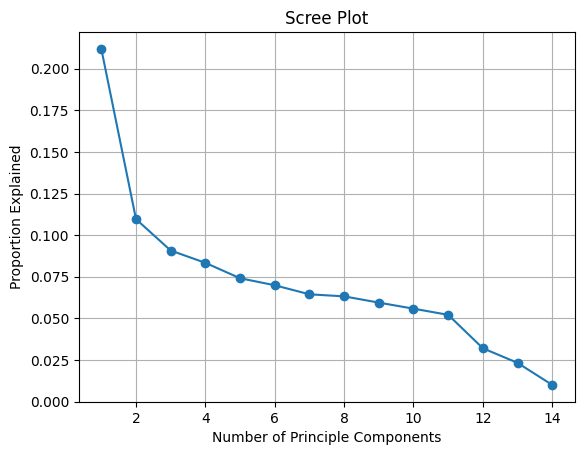

In [462]:
proportion_explained = explained_variance_ratio / sum(explained_variance_ratio)

plt.plot(range(1, len(proportion_explained) + 1), proportion_explained, marker = 'o', linestyle = '-')
plt.title('Scree Plot')
plt.xlabel('Number of Principle Components')
plt.ylabel('Proportion Explained')
plt.grid(True)
plt.show()

In [463]:
pca = PCA(n_components=11)
pca_result = pca.fit_transform(standardized_data)

eigenvalues = pca.explained_variance_ # variance explained per component

eigen_df = pd.DataFrame({
    'Eigenvalue': eigenvalues,
    'Explained Variance Ratio': pca.explained_variance_ratio_,
    'Cumulative Explained Variance': np.cumsum(pca.explained_variance_ratio_)
})
print(eigen_df.head(11))

    Eigenvalue  Explained Variance Ratio  Cumulative Explained Variance
0     2.967197                  0.211941                       0.211941
1     1.534671                  0.109618                       0.321559
2     1.270808                  0.090771                       0.412330
3     1.167148                  0.083367                       0.495697
4     1.037470                  0.074104                       0.569802
5     0.978550                  0.069896                       0.639698
6     0.902253                  0.064446                       0.704144
7     0.885015                  0.063215                       0.767358
8     0.832489                  0.059463                       0.826821
9     0.781411                  0.055815                       0.882636
10    0.729568                  0.052112                       0.934747


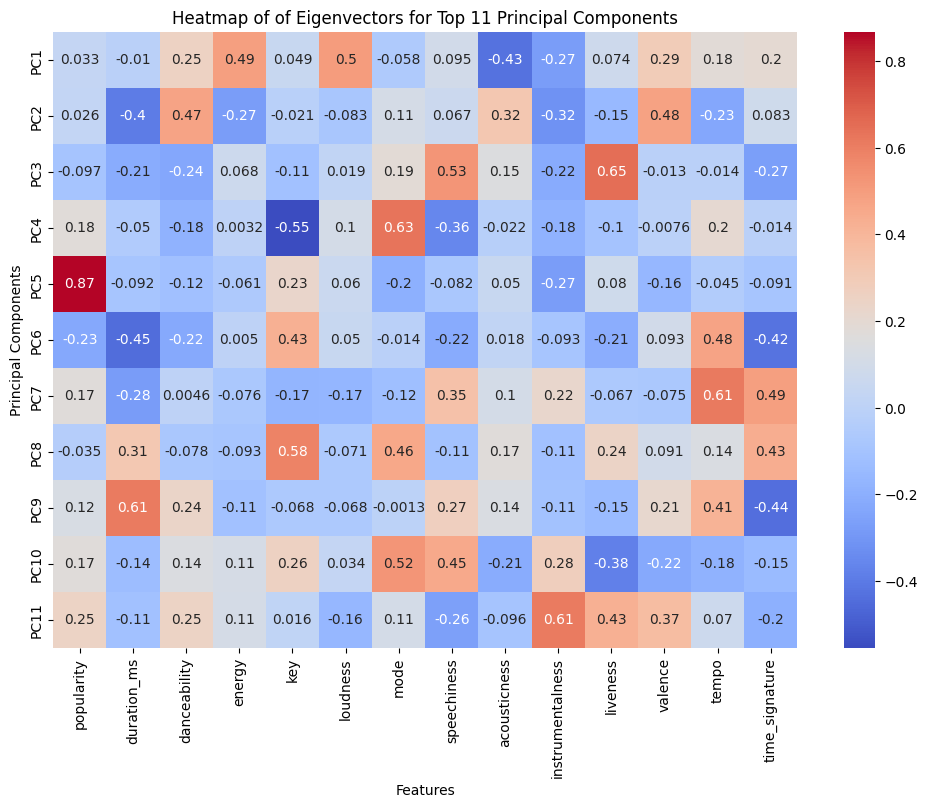

In [464]:
eigenvectors = pca.components_  # Shape: (11 components, n_features)

plt.figure(figsize=(12, 8))
sns.heatmap(eigenvectors, annot=True, cmap='coolwarm', xticklabels=numerical_features, yticklabels=[f'PC{i+1}' for i in range(11)])
plt.title('Heatmap of of Eigenvectors for Top 11 Principal Components')
plt.xlabel('Features')
plt.ylabel('Principal Components')
plt.show()

Example analysis:
- Energy (0.49) and loudness (0.5) are the most influential features defining PC1. PC1 accounts for about 21% of the total variance, so that means 21% of the data's variability can attributed to variations of energy and loudness.

# Project Check-in 6
Application of a neural network- Classification of track genre utilizing all numerical features.



In [465]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

In [466]:
X_tensor = torch.from_numpy(standardized_data).to(torch.float32)
y_tensor = torch.from_numpy(df['track_genre'].astype('category').cat.codes.values.copy())
y_tensor = y_tensor.to(torch.int64)
print("X_tensor:", X_tensor.shape, X_tensor.dtype)
print("y_tensor:", y_tensor.shape, y_tensor.dtype)

class JointDataset(Dataset):
    def __init__(self, x, y):
        self.x = x
        self.y = y
    def __len__(self):
        return len(self.x)
    def __getitem__(self, idx):
        return self.x[idx], self.y[idx]
joint_dataset = JointDataset(X_tensor, y_tensor)
train_loader = DataLoader(joint_dataset, batch_size=64, shuffle=True)
test_loader = DataLoader(joint_dataset, batch_size=64, shuffle=True)
# Define a neural network for Spotify
class Spotify(nn.Module):
    def __init__(self):
        super(Spotify, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(14, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 114)
        )

    def forward(self, x):
        return self.model(x)

X_tensor: torch.Size([114000, 14]) torch.float32
y_tensor: torch.Size([114000]) torch.int64


In [467]:
# Initialize model, loss, and optimizer
### To-do ###
spotify_model = Spotify()
spotify_loss_fn = nn.CrossEntropyLoss()
spotify_optimizer = optim.Adam(spotify_model.parameters(), lr=0.001)

In [ ]:
# Training the Spotify model
### Training takes a while ###
epochs = 20
for epoch in range(epochs):
    total_loss = 0
    for features, labels in train_loader:
        # Forward pass
        predictions = spotify_model(features)
        loss = spotify_loss_fn(predictions, labels)
        pass

        # Backward pass
        spotify_optimizer.zero_grad()
        loss.backward()
        spotify_optimizer.step()

        total_loss += loss.item()
        pass

    print(f"Epoch [{epoch + 1}/{epochs}], Loss: {total_loss / len(train_loader):.4f}")

Epoch [1/20], Loss: 3.2993
Epoch [2/20], Loss: 2.8746
Epoch [3/20], Loss: 2.7463
Epoch [4/20], Loss: 2.6731
Epoch [5/20], Loss: 2.6236
Epoch [6/20], Loss: 2.5834


In [ ]:
# Evaluating on test data
correct = 0
total = 0
with torch.no_grad():
    for features, labels in test_loader:
        ### To-do ###
        predictions = spotify_model(features)
        _, predicted = torch.max(predictions.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        pass

accuracy = 100 * correct / total
print(f"Test Accuracy: {accuracy:.2f}%")

2. Our metrics for evaluation are loss and accuracy. Loss refers to how well our model is fitting to the training data, whereas accuracy evaluates how well our model is actually performing on real data.

3. Training was attempted with batch sizes of 64, hidden layer sizes of 14-128-64-114, and a learning rate of 0.001. Achieved relatively high loss rates of 2.4 after 20 epochs. Adjusting learning rate to 0.005 gave us even worse results. Returned learning rate back to 0.001 and modified the hidden layers to be more complex to 14-256-128-114, which very slightly improved our loss to 2.38. This gave us an unacceptable accuracy rate of 35.69%.